<a href="https://colab.research.google.com/github/Daffaariff/Detection-Aksara-sunda-using-YOLOv8/blob/master/YOLOv8-SundaScript-Training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## How to Train YOLOv8 Object Detection on a Custom Dataset

In [ ]:
!nvidia-smi

Mon Feb 19 14:35:20 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   52C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 715.1/715.1 kB 10.7 MB/s eta 0:00:00


## unzip dataset

In [ ]:
!unzip - aksara-sunda.zip -d /content/

unzip:  cannot find or open aksara-sunda.zip, aksara-sunda.zip.zip or aksara-sunda.zip.ZIP.


## Install YOLOv8

In [ ]:
from ultralytics import YOLO
import os
from IPython.display import display, Image
from IPython import display
display.clear_output()
!yolo mode=checks

Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/__init__.py", line 509, in entrypoint
    raise ValueError(f"Invalid 'mode={mode}'. Valid modes are {MODES}.\n{CLI_HELP_MSG}")
ValueError: Invalid 'mode=<module 'ultralytics.utils.checks' from '/usr/local/lib/python3.10/dist-packages/ultralytics/utils/checks.py'>'. Valid modes are ('train', 'val', 'predict', 'export', 'track', 'benchmark').

    Arguments received: ['yolo', 'mode=checks']. Ultralytics 'yolo' commands use the following syntax:

        yolo TASK MODE ARGS

        Where   TASK (optional) is one of ('detect', 'segment', 'classify', 'pose', 'obb')
                MODE (required) is one of ('train', 'val', 'predict', 'export', 'track', 'benchmark')
                ARGS (optional) are any number of custom 'arg=value' pairs like 'imgsz=320' that override defaults.
                    See all ARGS at ht

## Train YOLOv8 Model on Custom Dataset

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="YOUR_API")
project = rf.workspace("aksarasunda").project("aksara-sunda-eayhq")
dataset = project.version(2).download("yolov8")



loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.1.15, to fix: `pip install ultralytics==8.0.196`


Extracting Dataset Version Zip to Aksara-Sunda-2 in yolov8:: 100%|██████████| 10324/10324 [00:01<00:00, 6427.51it/s]


In [ ]:
!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=20 imgsz=640

Ultralytics YOLOv8.1.15 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/Aksara-Sunda-2/data.yaml, epochs=20, time=None, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True

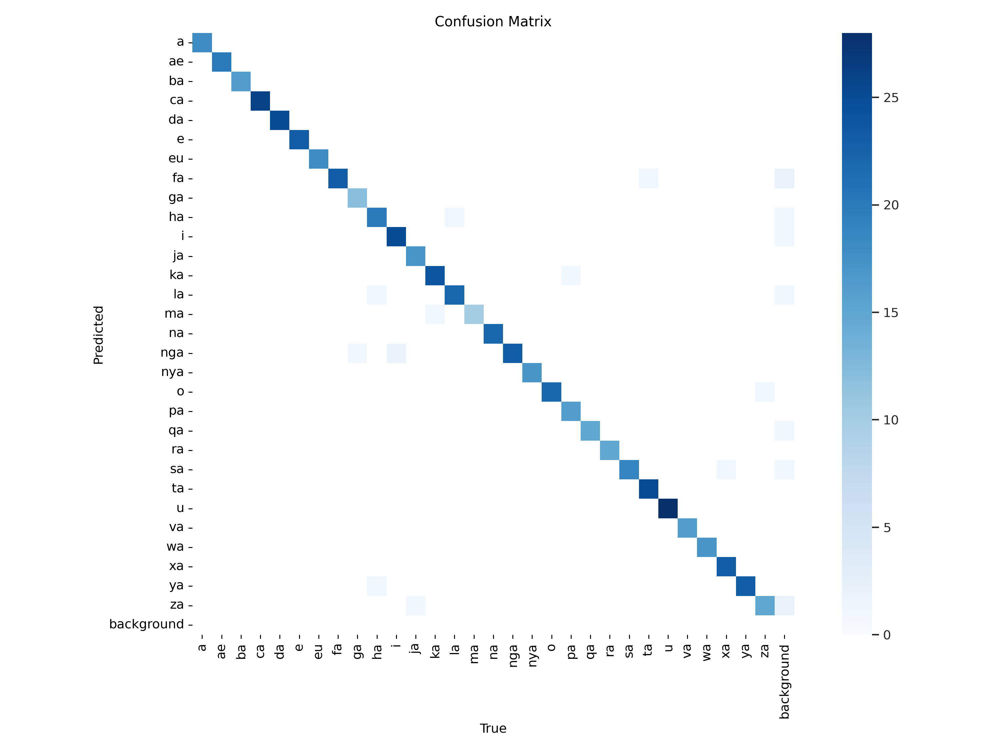

In [ ]:
Image(filename=f'/content/runs/detect/train3/confusion_matrix.png', width=600)

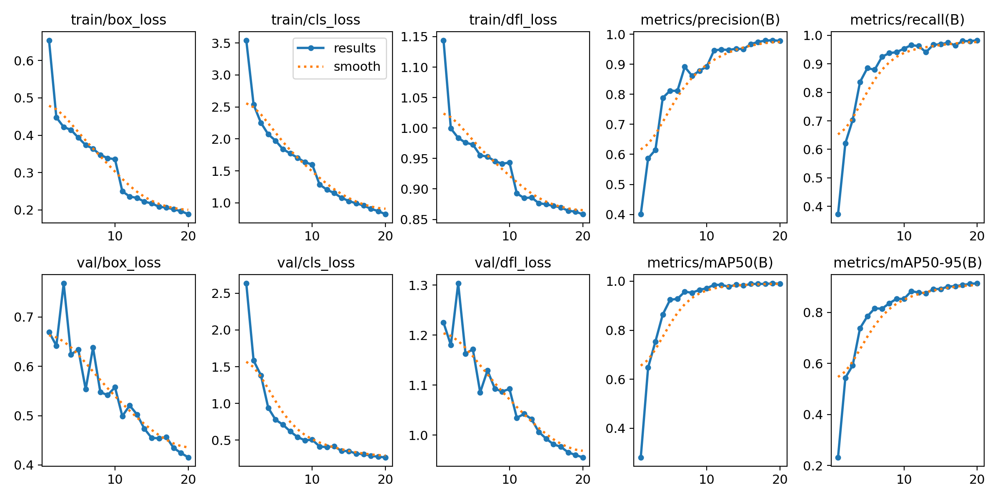

In [ ]:
Image(filename=f'/content/runs/detect/train3/results.png', width=600)

In [ ]:
!yolo task=detect mode=val model=/content/runs/detect/train3/weights/best.pt data={dataset.location}/data.yaml

Ultralytics YOLOv8.1.15 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11137194 parameters, 0 gradients, 28.5 GFLOPs
val: Scanning /content/Aksara-Sunda-2/valid/labels.cache... 607 images, 0 backgrounds, 0 corrupt: 100% 607/607 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 38/38 [00:10<00:00,  3.59it/s]
                   all        607        607      0.978      0.983       0.99      0.914
                     a        607         18      0.984          1      0.995      0.899
                    ae        607         20      0.989          1      0.995      0.907
                    ba        607         16      0.997          1      0.995      0.958
                    ca        607         26      0.999          1      0.995      0.944
                    da        607         25          1      0.975      0.995      0.904
                     e        607         23

In [ ]:
!yolo task=detect mode=predict model=/content/runs/detect/train3/weights/best.pt conf=0.5 source={dataset.location}/test/images save_txt=true save_conf=true

Ultralytics YOLOv8.1.15 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11137194 parameters, 0 gradients, 28.5 GFLOPs

image 1/303 /content/Aksara-Sunda-2/test/images/a_101_jpg.rf.3a3080c9d1ad8772225de0a424f0c2ee.jpg: 640x640 1 a, 16.4ms
image 2/303 /content/Aksara-Sunda-2/test/images/a_114_jpg.rf.5dc74f5c932ef7158130fd0ef622b7cd.jpg: 640x640 1 a, 16.4ms
image 3/303 /content/Aksara-Sunda-2/test/images/a_117_jpg.rf.6473aab44a7551f67201300924be4014.jpg: 640x640 1 a, 16.4ms
image 4/303 /content/Aksara-Sunda-2/test/images/a_16_jpg.rf.e40b263db8193dfab21fbfddfd24c0f2.jpg: 640x640 1 a, 16.4ms
image 5/303 /content/Aksara-Sunda-2/test/images/a_31_jpg.rf.e21c32c4733a724bb5fd6840d10a4888.jpg: 640x640 1 a, 16.4ms
image 6/303 /content/Aksara-Sunda-2/test/images/a_32_jpg.rf.0cd99b9c77f5f580b45e708798694999.jpg: 640x640 1 a, 16.4ms
image 7/303 /content/Aksara-Sunda-2/test/images/a_3_jpg.rf.af7cf7ed265e1ae2aa05c322271ae348.jpg: 640x640 1 a, 16.4ms
ima

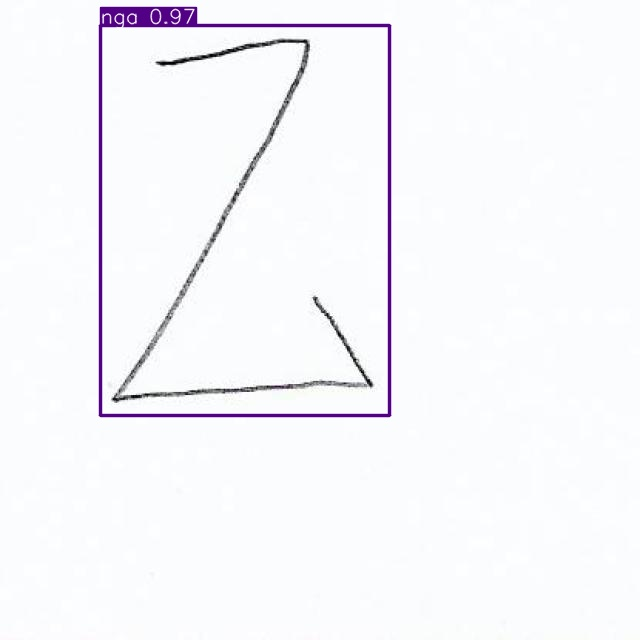

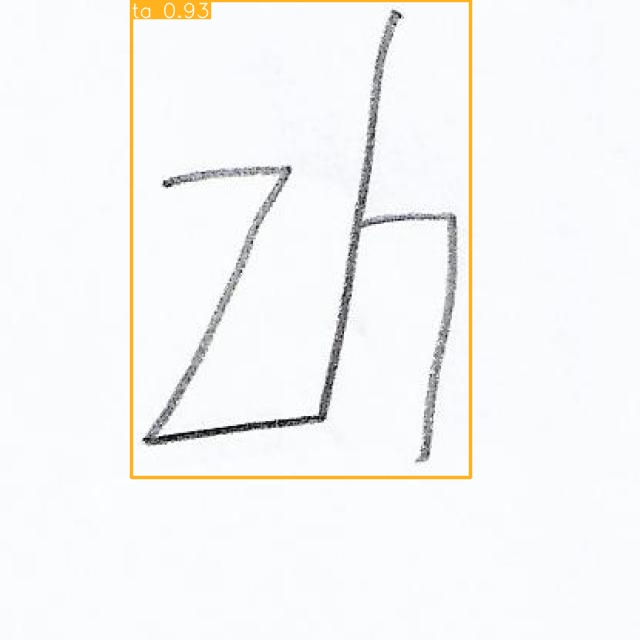

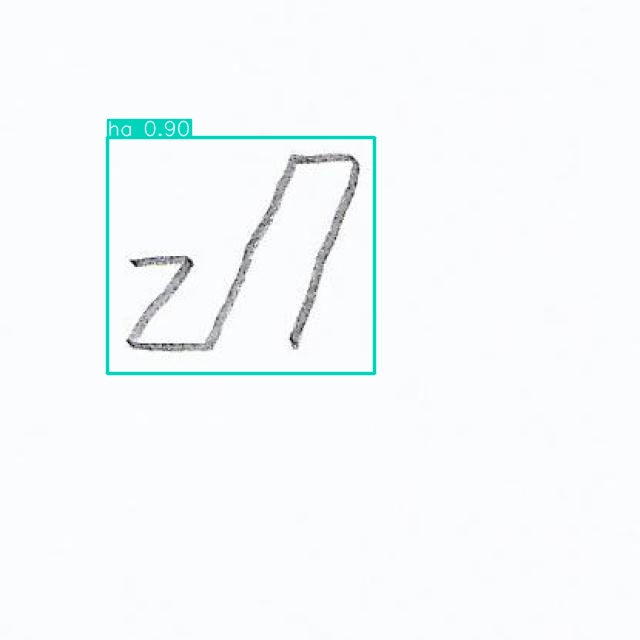

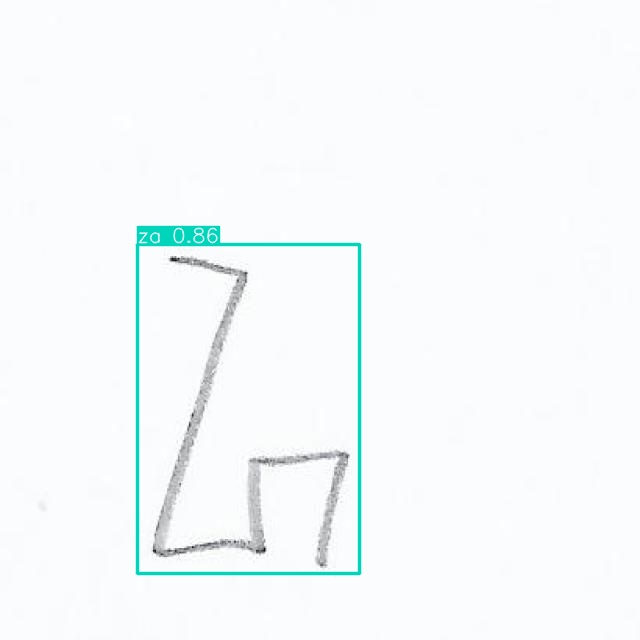

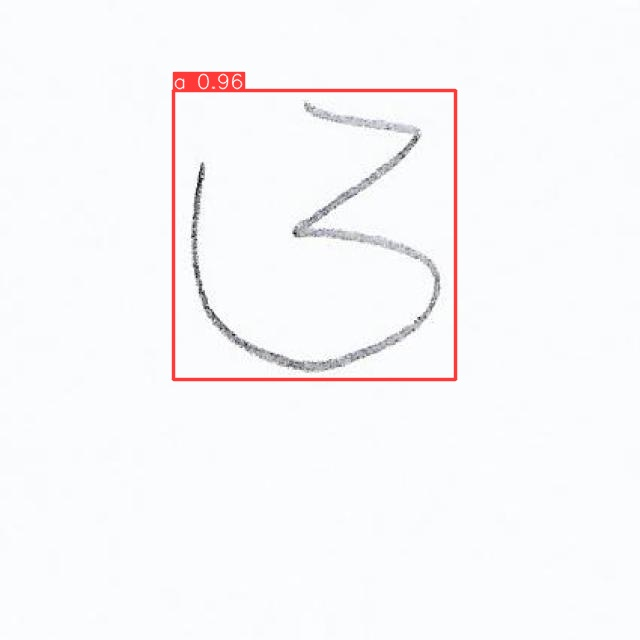

...

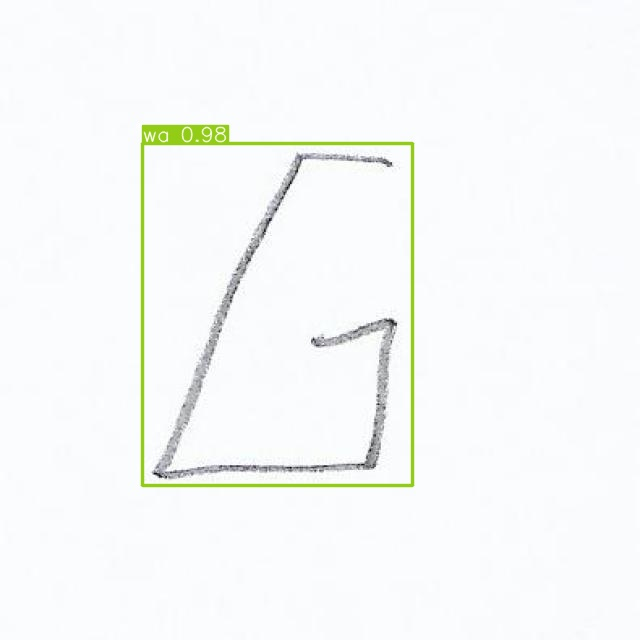

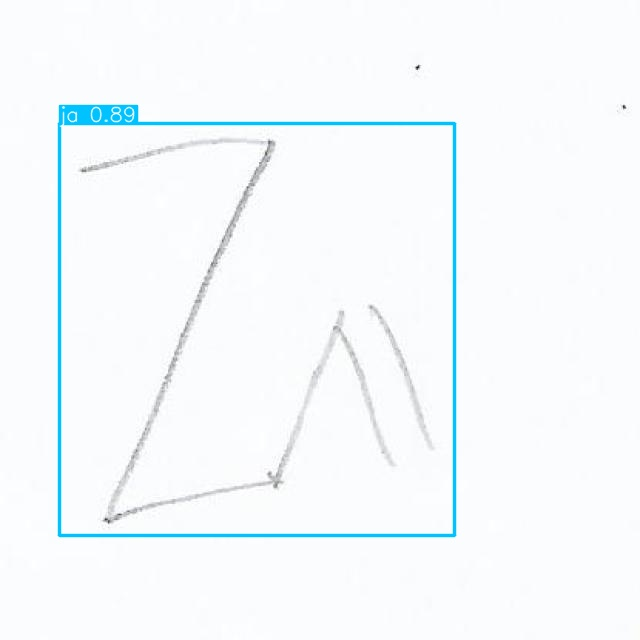

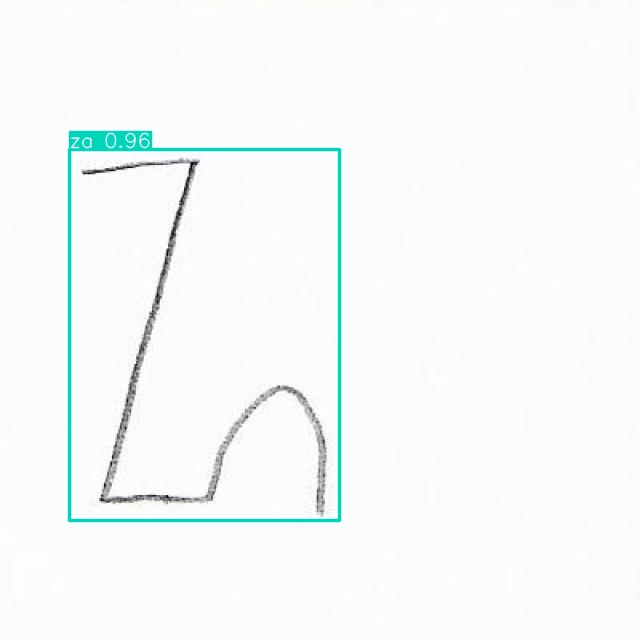

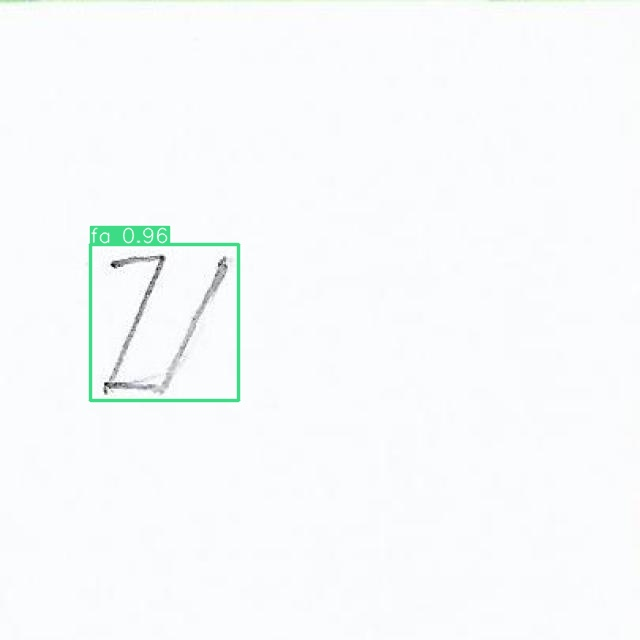

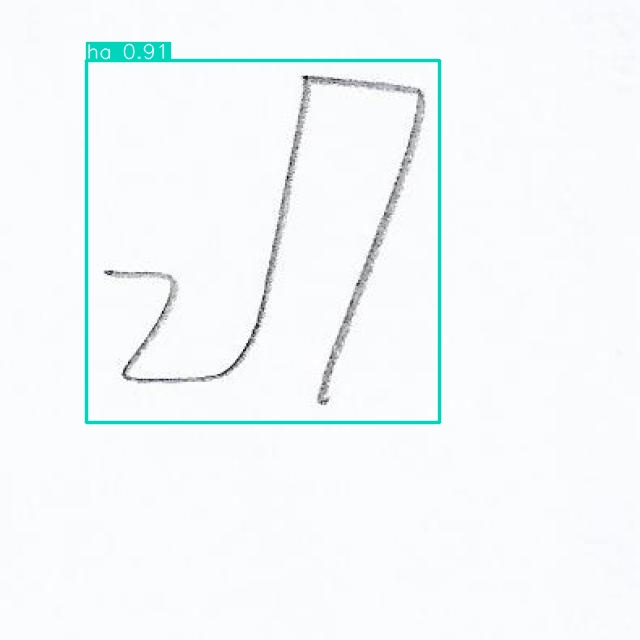

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg'):
      display(Image(filename=image_path, height=600))
      print("\n")